## NEWS HEADLINES SARCASM DETECTION USING NLP


Build a model to detect whether a text is sarcastiv or not. Use 80-20 split for training and test respectively. Examine model performances in both training and test samples.


## Importing Libraries

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Bidirectional
from keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, classification_report
import numpy as np
import matplotlib.pyplot as plt
import nltk
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_json('E:/Vaibhav/Study_CS/IIT PG/Sarcasm_Headlines_Dataset.json',lines=True)
df

,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...
...,...,...,...
28614,1,jews to celebrate rosh hashasha or something,https://www.theonion.com/jews-to-celebrate-ros...
28615,1,internal affairs investigator disappointed con...,https://local.theonion.com/internal-affairs-in...
28616,0,the most beautiful acceptance speech this week...,https://www.huffingtonpost.com/entry/andrew-ah...
28617,1,mars probe destroyed by orbiting spielberg-gat...,https://www.theonion.com/mars-probe-destroyed-...


In [3]:
# Display the first few rows of the dataset
df.head()

,is_sarcastic,headline,article_link
0,1,thirtysomething scientists unveil doomsday clo...,https://www.theonion.com/thirtysomething-scien...
1,0,dem rep. totally nails why congress is falling...,https://www.huffingtonpost.com/entry/donna-edw...
2,0,eat your veggies: 9 deliciously different recipes,https://www.huffingtonpost.com/entry/eat-your-...
3,1,inclement weather prevents liar from getting t...,https://local.theonion.com/inclement-weather-p...
4,1,mother comes pretty close to using word 'strea...,https://www.theonion.com/mother-comes-pretty-c...


  0%|                                                                                          | 0/349 [00:00<…

DataPrep Report
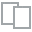
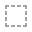
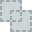
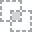
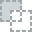
...
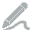
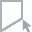
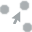
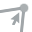
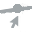

In [59]:
from dataprep.eda import create_report
report = create_report(df)
report

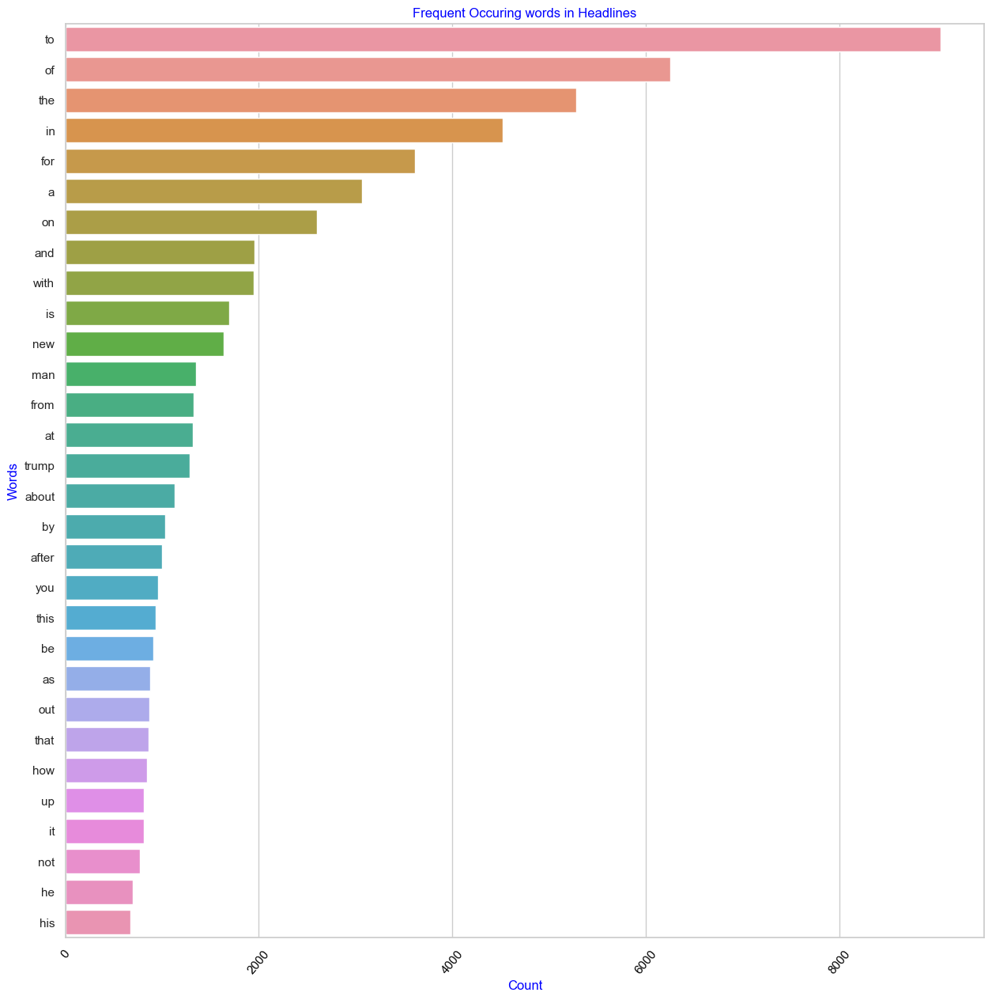

In [4]:
from collections import Counter #import Counter for finding most common words
import seaborn as sns #import searbon for vizualization result

text = df['headline']
words = text.str.split(expand=True).unstack()
result_count = Counter(words).most_common()
result_df = pd.DataFrame(result_count).reset_index().drop(0) #converting to Dataframe and drop the Nones values
#result_df
#vizualize result
sns.set_theme(style="whitegrid") 
f, ax = plt.subplots(figsize=(15, 15)) 
sns.barplot(y=result_df[0][0:30], x=result_df[1][0:30], data=result_df, palette=None)
plt.ylabel('Words', color="blue")  # Add an x-label to the axes.
plt.xlabel('Count', color="blue")  # Add a y-label to the axes.
plt.title("Frequent Occuring words in Headlines", color="blue") 
plt.xticks(rotation=50);
ax.tick_params(axis='x', colors='black')
plt.show()

In [5]:
sarcastic = pd.DataFrame(df[df['is_sarcastic']==1]['headline'].str.split(expand=True).unstack().value_counts()).reset_index()

In [6]:
non_sarcastic = pd.DataFrame(df[df['is_sarcastic']==0]['headline'].str.split(expand=True).unstack().value_counts()).reset_index()

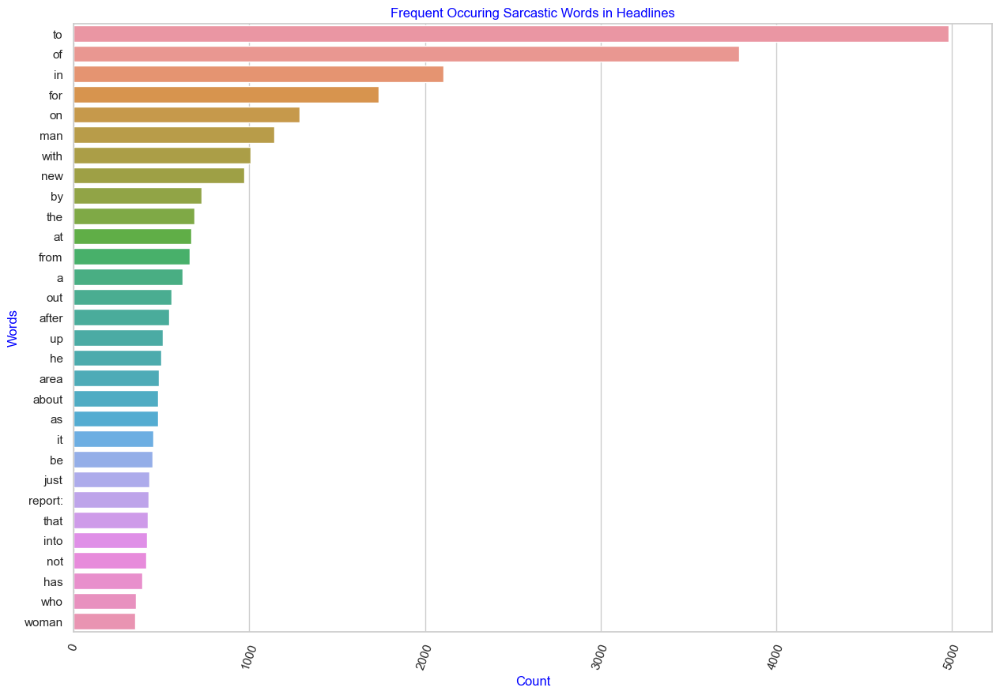

In [7]:
#vizualize result
sns.set_theme(style="whitegrid") 
f, ax = plt.subplots(figsize=(15, 10)) 
sns.barplot(y=sarcastic['index'][0:30], x=sarcastic[0][0:30], data=result_df, palette=None)
plt.ylabel('Words', color="blue")  # Add an x-label to the axes.
plt.xlabel('Count', color="blue")  # Add a y-label to the axes.
plt.title("Frequent Occuring Sarcastic Words in Headlines", color="blue") 
plt.xticks(rotation=70);
plt.show()

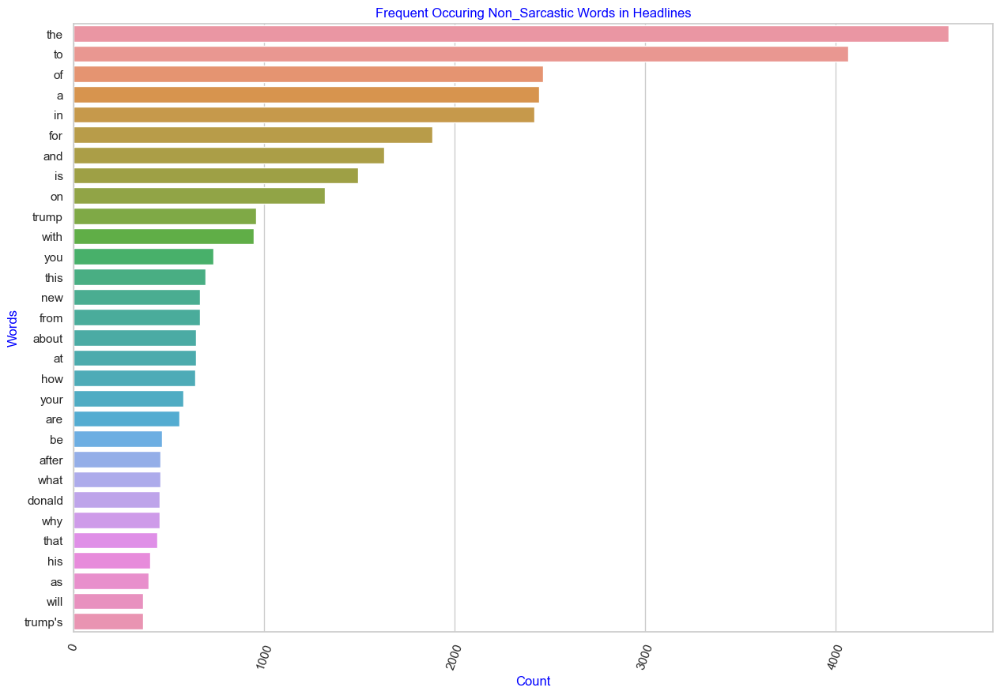

In [8]:
#vizualize result
sns.set_theme(style="whitegrid") 
f, ax = plt.subplots(figsize=(15, 10)) 
sns.barplot(y=non_sarcastic['index'][0:30], x=non_sarcastic[0][0:30], data=result_df, palette=None)
plt.ylabel('Words', color="blue")  # Add an x-label to the axes.
plt.xlabel('Count', color="blue")  # Add a y-label to the axes.
plt.title("Frequent Occuring Non_Sarcastic Words in Headlines", color="blue") 
plt.xticks(rotation=70);
plt.show()

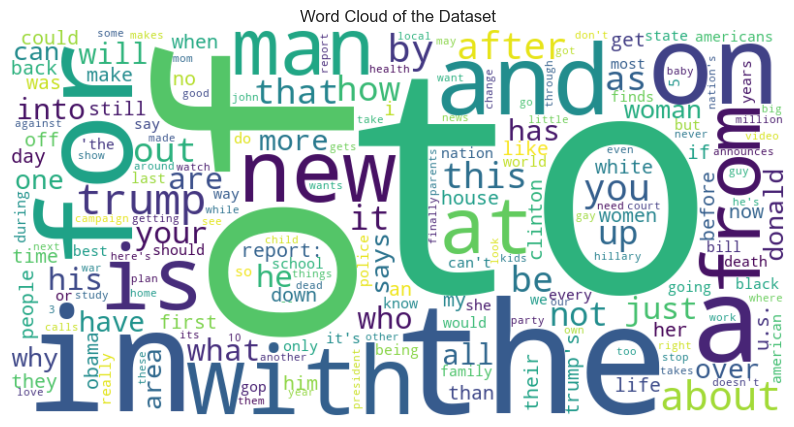

In [33]:
from wordcloud import WordCloud

# Calculate word frequency
word_freq = {}
for headline in df['headline']:
    words = headline.split()
    for word in words:
        if word in word_freq:
            word_freq[word] += 1
        else:
            word_freq[word] = 1

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of the Dataset')
plt.show()

## Preprocess and Model Build

In [9]:
# Preprocess the dataset
X = df['headline']
y = df['is_sarcastic']

In [10]:
# Encode the target variable
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

In [11]:
# Split the dataset into training and testing sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
# Tokenize the text data
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

In [13]:
# Convert text data to numerical sequences
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

In [14]:
# Pad sequences to ensure uniform length
maxlen = 100
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

In [15]:
# Build the LSTM model
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index)+1, output_dim=100, input_length=maxlen))
model.add(Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2)))
model.add(Dense(1, activation='sigmoid'))

In [16]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [17]:
# Train the model
history = model.fit(X_train_pad, y_train, epochs=10, batch_size=32, validation_split=0.2, callbacks=[EarlyStopping(monitor='val_loss', patience=3)])


Epoch 1/10


573/573 [==============================] - 227s 380ms/step - loss: 0.4100 - accuracy: 0.8037 - val_loss: 0.3373 - val_accuracy: 0.8522
Epoch 2/10
573/573 [==============================] - 222s 388ms/step - loss: 0.1933 - accuracy: 0.9239 - val_loss: 0.3498 - val_accuracy: 0.8511
Epoch 3/10
573/573 [==============================] - 220s 385ms/step - loss: 0.0832 - accuracy: 0.9711 - val_loss: 0.4645 - val_accuracy: 0.8406
Epoch 4/10
573/573 [==============================] - 238s 415ms/step - loss: 0.0370 - accuracy: 0.9874 - val_loss: 0.5554 - val_accuracy: 0.8377


In [18]:
# Evaluate the model on training and test sets
train_loss, train_acc = model.evaluate(X_train_pad, y_train)
test_loss, test_acc = model.evaluate(X_test_pad, y_test)
print("Training Accuracy:", train_acc)
print("Testing Accuracy:", test_acc)


179/179 [==============================] - 10s 56ms/step - loss: 0.5363 - accuracy: 0.8394
Training Accuracy: 0.9654509425163269
Testing Accuracy: 0.8394479155540466


In [22]:
# Threshold probabilities to get predicted classes
y_pred_prob = model.predict(X_test_pad)

179/179 [==============================] - 6s 35ms/step


In [26]:
y_test_decoded = label_encoder.inverse_transform(y_test)

In [27]:
# Threshold probabilities to get predicted classes
y_pred = (y_pred_prob > 0.5).astype(int)

In [28]:
# Decode predictions
y_pred_decoded = label_encoder.inverse_transform(y_pred.flatten())

In [29]:
# Print classification report
print(classification_report(y_test_decoded, y_pred_decoded))

              precision    recall  f1-score   support

           0       0.84      0.86      0.85      2995
           1       0.84      0.82      0.83      2729

    accuracy                           0.84      5724
   macro avg       0.84      0.84      0.84      5724
weighted avg       0.84      0.84      0.84      5724



In [35]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test_decoded,y_pred_decoded)
cm

array([[2572,  423],
       [ 496, 2233]], dtype=int64)

<Axes: >

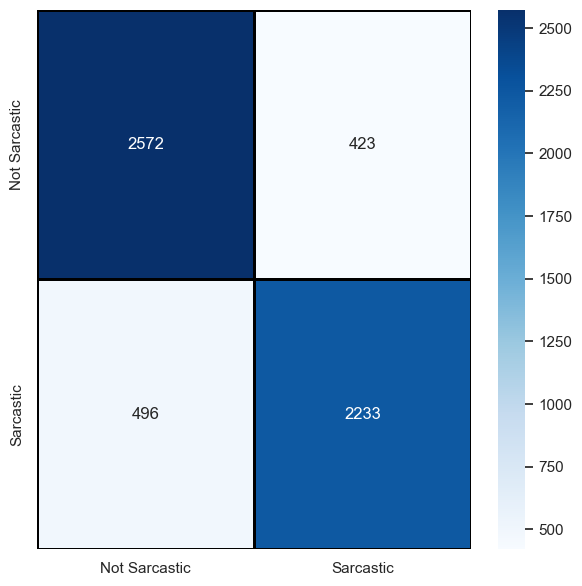

In [36]:
cm = pd.DataFrame(cm , index = ['Not Sarcastic','Sarcastic'] , columns = ['Not Sarcastic','Sarcastic'])
plt.figure(figsize = (7,7))
sns.heatmap(cm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = ['Not Sarcastic','Sarcastic'] , yticklabels = ['Not Sarcastic','Sarcastic'])

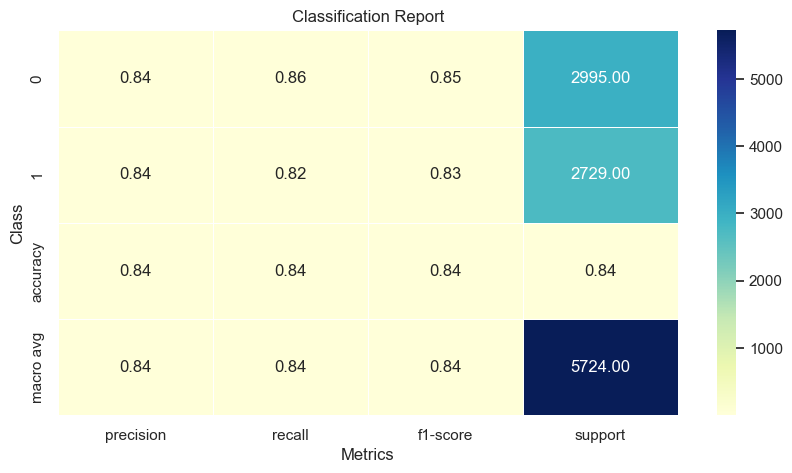

In [58]:
# Generate classification report
report = classification_report(y_test_decoded, y_pred_decoded, output_dict=True)

# Convert classification report to DataFrame
report_df = pd.DataFrame(report).transpose()

# Plot heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(report_df.iloc[:-1, :].astype(float), annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title('Classification Report')
plt.xlabel('Metrics')
plt.ylabel('Class')
plt.show()